In [2034]:
# Carlos Eduardo Velasco Elenes
# A01708634
# November 19th 2023

# Estrategia 
#
# Model: 
# La estrategia que decidí utilizar para la simulación fue, primero, instanciar a los agentes dentro del grid en posiciones random
# Después, asginarles valores a las celdas del grid utilizando la matriz de boxes_amount que tiene el model.
# La asignación de estos valores se hará de la siguiente manera: 
#   1) Generar una coordenada random dentro del grid
#   2) Asignarle a esa celda un valor entre 1 a 3
# El punto 2 se llevó a cabo ya que si asignamos a las celdas valores de uno en uno la complejidad del ciclo while será siempre O(N), en cambio, con
# el acercamiento que tengo implementado estoy garantizando casos en los que la complejidad pueda ser O(N/2) o incluso O(N/3)
# El modelo tiene metodos para acceder y modificar los atributos, como valores del grid y los steps
# El modelo tiene un metodo para recorrer todo el grid y verificar que solo existan pilas de 5 cajas en todo el grid. Si es así, la simulacion habría terminado

# Agent:
# El agente tiene un estado de isCarrying que representa si está cargando actualmente una caja o no
# El agente puede recoger y colocar cajas en celdas que están a su derecha, izquierda, arriba o abajo e incluso la celda actual
# Recoger cajas:
#   La estrategia que se utiliza para recoger cajas es que el agente checa las cajas que tienen su celda actual y las de sus vecinos, 
#   encuentra la celda que tiene menos cajas y esa es la que recoge. Esto se hace para que las celdas con menos cajas vayan desapareciendo
#   y las celdas con un mayor número de cajas prevalezcan. Así garantizamos que menos celdas tengan cajas y que esas celdas tengan más cajas.
#   El agente también ignora las celdas que están vacías y las que ya están llenas, porque no queremos colocar cajas en una celda vacía ya que
#   tendríamos más celdas con cajas y menos organización, y no queremos que recoja cajas de celdas que ya están en su capacidad deseada.
#   Después de recoger una caja el agente se mueve.
# Colocar cajas:
#   La estrategia que se utiliza para colocar cajas es que el agente checa las cajas que tienen su celda actual y las de sus vecinos, 
#   encuentra la celda que tiene más cajas y esa es en la que coloca la caja. Esto se hace para que las celdas con más cajas lleguen más rápido
#   a su máxima capacidad y así continuar con otras celdas. Así garantizamos que menos celdas tengan cajas y que esas celdas tengan más cajas.
#   El agente también ignora las celdas que están vacías y las que ya están llenas, porque no queremos colocar cajas en una celda vacía ya que
#   tendríamos más celdas con cajas y menos organización, y no queremos que coloque cajas de celdas que ya están en su capacidad deseada.
#   Después de recoger una caja el agente se mueve.
# Movimiento de agente:
#   El agente se mueve de manera random a una celda que no está ocupada por otro agente

# Gráficas: 
# Se tienen dos tipos de gráficas en la simulación:
# Mapas de calor: Estos mapas de calor se agregaron a la simulación para que se visualize de una manera más sencilla (mediante representacion de colores)
#   cuántas cajas tienen las celdas al principio y al final de la simulación.
# Gráficas animadas: Esta animación se agregó a la simulación para poder ver cómo la organización de las cajas cambia a través de las iteraciones
# en la simulación. Aquí se puede ver cómo todas las celdas quedan ordenadas en pilas de 5 (suele tardarse poco menos de 3 minutos para cargar
# todos los frames de la animación)

# Formas de optimizar el código:
# Como se puede observar en la clase del agente, hay un método y un atributo comentado. Tanto el método como el atributo me ayudaban para que los 
# agentes solo pudieran colocar cajas en celdas que tuvieran un número de cajas igual o mayor de la celda en la que recogieron su caja.
# Esto lo implemente debido a que en la simulación hay una gran posibilidad de que hayan pasos repetitivos o innecesarios. Por ejemplo: si mi
# agente toma una caja de donde habían 2 cajas y la coloca en una celda donde había 1 caja, en los steps que eso tomara no iba a pasar absoultamente
# nada, seguiría teniendo una celda con 2 cajas y otra con una. Por eso, decidí implementar esa función, porque si un agente toma una caja de una celda
# que tenía 2, solo la puede colocar en una celda que tiene 2 o más cajas. 
# Esta función no llegó a la implementación final, ya que esto generaba un problema cuando por ocasiones quedaban celdas con una o dos cajas
# y las demás ya tenían 5 cajas. Los agentes que agarraban cajas de las celdas con 2 no podía colocarlas en las celdas con una caja. Debido a eso
# a veces las simulaciones no se terminaban, pero las que se terminaban eran un poco más eficientes que las simulaciones con la solución actual
# ya que el rango de pasos que tomaba esas simulaciones eran de 800-6000 pasos, y mi solución actual, en raras ocasiones supera los 10000 pasos
# (aunque con muchas iteraciones la moda está entre 2000-6000 pasos)

In [2035]:
# Multiple agents grid package
from mesa import Agent, Model 

# Multiple agents in one cell package
from mesa.space import SingleGrid

# Instantiate agents at the same time package
from mesa.time import RandomActivation

# Obtain info in every iteration of the simulation
from mesa.datacollection import DataCollector

# Numeric values management
import numpy as np

# Time measurement package
import time
# Random package
import random

# matplotlib lo usaremos crear una animación de cada uno de los pasos del modelo.
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
plt.rcParams["animation.html"] = "jshtml"
matplotlib.rcParams['animation.embed_limit'] = 2**128

In [2026]:
class RobotAgent(Agent):
    # Initialize the agent
    def __init__(self, id, model):
        super().__init__(id, model)
        # Set the initial state of the agent that it's not carrying a box
        self.isCarrying = False
        # Attribute to save the value 
        # self.last_visited = 0
    
    # Next decision for the agent
    def step(self):
        x, y = self.pos

        # If the agent is carrying a box
        if self.isCarrying:
            # Place the box
            self.place_box(x, y)
        # If it's not carrying
        else:
            # Pick a box
            self.pick_box(x, y)

    # The agent picks a box from a cell
    def pick_box(self, x, y):
        # Obtain the neighbor and current cells
        neighborhood = self.model.grid.get_neighborhood(self.pos, moore=False, include_center=True)
        # Variable to help find the minimal
        min_value = float('inf')  
        # Variable to store the cell of the minimal value
        min_cell = None

        # For every neighbor cell
        for cell in neighborhood:
            # Coordinates of the neighbor cell
            cell_x, cell_y = cell
            # Value of the neighbor cell
            cell_value = self.model.get_cell_value(cell_x, cell_y)

            # If the cell has no boxes and it's not at full capacity and the cell value is less than the minimal value, then assign 
            # the minimal value to that cells value
            if not self.model.is_empty(cell_x, cell_y) and not self.model.is_full(cell_x, cell_y) and cell_value < min_value:
                min_value = cell_value
                min_cell = cell
        # If there is a minimal value
        if min_cell:
            # Pick the boxx
            # self.last_visited = self.model.get_cell_value(*min_cell)
            self.model.pick_box(*min_cell)
            self.isCarrying = True
        # Move the agent
        self.move(x, y)

    # The agent places a box in a cell
    def place_box(self, x, y):
        # Obtain the neighbor and current cells
        neighborhood = self.model.grid.get_neighborhood(self.pos, moore=False, include_center=True)
        # Variable to help find the minimal
        max_value = -1
        # Variable to store the cell of the max value
        max_cell = None

        # For every neighbor cell
        for cell in neighborhood:
            # Coordinates of the neighbor cell
            cell_x, cell_y = cell
            cell_value = self.model.get_cell_value(cell_x, cell_y)

            # If the cell has no boxes and it's not at full capacity and the cell value is more than the max value, then assign 
            # the max value to that cells value
            if not self.model.is_full(cell_x, cell_y) and not self.model.is_empty(cell_x, cell_y) and cell_value > max_value:
                max_value = cell_value
                max_cell = cell

        # If there is a max cell
        if max_cell:
            # Place the box
            self.model.place_box(*max_cell)
            # self.last_visited = 0
            self.isCarrying = False

        # Move the agent
        self.move(x, y)
    
    # Method to move the agent in the grid
    def move(self, x, y):
        # Move to a cell if there are empty cells
        possible_moves = [cell for cell in self.model.grid.get_neighborhood(self.pos, moore=False, include_center=False) if self.model.grid.is_cell_empty(cell)]

        # If there are possible moves then move to a random cell
        if possible_moves:
            new_position = random.choice(possible_moves)
            self.model.grid.move_agent(self, new_position)

    # Method to check if a cell is greater or equal in value than the cell where the agent last picked a box
    #def is_valid_cell(self, x, y):
        #return self.model.get_cell_value(x, y) >= self.last_visited


In [2027]:
def get_grid(model):
    grid = np.zeros( (model.grid.width, model.grid.height) )
    grid = np.copy(model.boxes_amount)
    return grid

In [2028]:
class RobotModel(Model):
    np.random.seed(67890)
    random.seed(67890)
    def __init__(self, width, height, num_agents, total_boxes):
        # Create the grid (since can't be in the same position, we need to have a singlegrid)
        self.grid = SingleGrid(width, height, torus = False)
        # Activate all of the agents at the same time
        self.schedule = RandomActivation(self)
        # Collect the data of each step
        self.datacollector = DataCollector(model_reporters={"CellValues": get_grid})
        # Attribute to store the values of the cells in the grid
        self.boxes_amount = np.zeros((width, height))
        # Attribute to count the amount of steps the simulation is taking
        self.steps = 0
        # Attribute to count the amount of boxes in the grid
        self.total_boxes_grid = 0
        # Attribute to set the state of the simulation
        self.finished = False

        id = 0

        # Instantiate the agents in the position (1,1). The number of agents that will be instantiated are specified by the parameter num_agents
        for _ in range(num_agents):
            # Initialize the agent
            agent = RobotAgent(id, self)
            # Add it to the schedule
            self.schedule.add(agent)
            # Place the agent in a random position
            x, y = self.random_empty_cell()
            self.grid.place_agent(agent, (x, y))
            # Increment the id to guarantee unique keys
            id += 1

        # Place the dirty cells in the grid at random positions
        while total_boxes > self.total_boxes_grid:
            # Get the random coordinates for the new dirty cell
            x, y = self.random_empty_cell()
            if total_boxes - self.total_boxes_grid >= 3:
                # Set the value of that cell to a value from 1 - 3
                option = np.random.randint(1, 4)
            elif total_boxes - self.total_boxes_grid == 2:
                option = np.random.randint(1, 3)
            elif total_boxes - self.total_boxes_grid == 1:
                option = np.random.randint(1, 2)
            self.boxes_amount[x][y] = option
            self.total_boxes_grid += option
        print(f"El número de cajas en el grid son: {self.total_boxes_grid}")


    
    # Continue with the next step 
    def step(self):
        self.datacollector.collect(self)
        self.schedule.step()
        self.steps += 1
        self.is_finished()

    # Method to add one box to the cell
    def place_box(self, x, y):
        self.boxes_amount[x][y] += 1

    # Method to substract one box to the cell
    def pick_box(self, x, y):
        self.boxes_amount[x][y] -= 1

    # Method to check if the cell has no boxes
    def is_empty(self, x, y):
        return self.boxes_amount[x][y] == 0
    
    # Method to check if the cell is at full capacity
    def is_full(self, x, y):
        return self.boxes_amount[x][y] == 5
    
    # Method to obtain the amount of boxes of the cell
    def get_cell_value(self, x, y):
        return self.boxes_amount[x][y]
    
    # Method to check if the cell has boxes
    def has_box(self, x, y):
        return self.get_cell_value(x, y) > 0

    # Method to obtain the amount of steps required for the simulation
    def get_steps(self):
        return self.steps
    
    # Check if all the cells in the grid have values of 0 or 5. If yes, then the simulation has finished
    def is_finished(self):
        for x in range(self.grid.width):
            for y in range(self.grid.height):
                cell_value = self.boxes_amount[x][y]
                if cell_value != 0 and cell_value != 5:
                    return False
        self.finished = True
        return True
    
    # Method to get the state of the simulation
    def get_finished(self):
        return self.finished

    # Method to obtain the coordinates of a random cell that is available
    def random_empty_cell(self):
        # Get a random empty cell in the grid
        x, y = self.random_pos()
        # If that cell is not available or has 3+ boxes, then find another cell
        while not self.grid.is_cell_empty((x, y)) or self.boxes_amount[x][y] >= 3:
            x, y = self.random_pos()
        return x, y
    
    # Method to select a random cell from the grid
    def random_pos(self):
        return self.random.randrange(self.grid.width), self.random.randrange(self.grid.height)

In [2029]:
# Method to show a heat map graph
def show_graph(model):
    boxes_counts = np.zeros( (model.grid.width, model.grid.height) )
    for cell in model.grid.coord_iter():
        (cell_content, (x, y)) = cell
        boxes_counts[x][y] = model.get_cell_value(x, y)

    plt.imshow(boxes_counts, interpolation='nearest')
    plt.colorbar()

El número de cajas en el grid son: 200


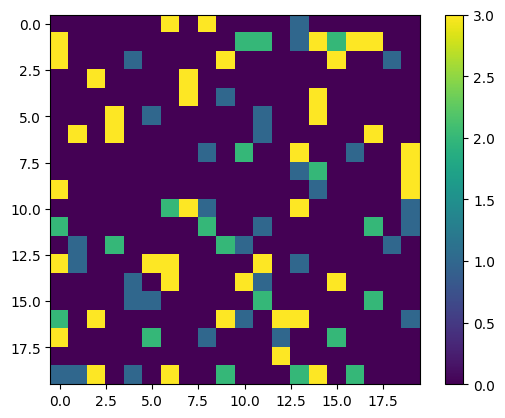

In [2030]:
WIDTH = 20
HEIGHT = 20
NUM_AGENTS = 5
TOTAL_BOXES = 200
MAX_STEPS = 100000

model = RobotModel(WIDTH, HEIGHT, NUM_AGENTS, TOTAL_BOXES)
show_graph(model)

Pasos necesarios para terminar la simulacion: 2389


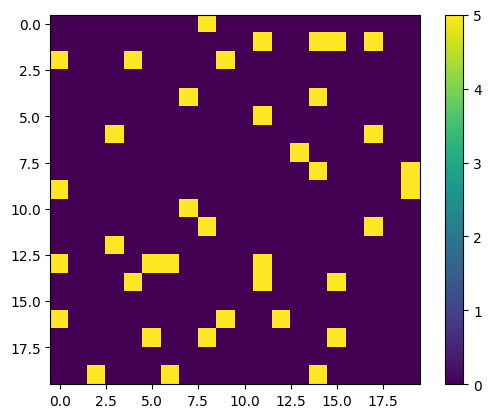

In [2031]:
# Start the timer
start_time = round(time.time(), 2)

# Iteration of the model defined by the maximum amount of steps
for i in range(MAX_STEPS):
    # If there are no more cells to be cleaned, then exit the loop
    if (model.get_finished()):
        break
    model.step()

# while not model.get_finished():
    #model.step()
# Stop the timer
end_time = round(time.time() - start_time, 2)
print(f"Pasos necesarios para terminar la simulacion: {model.get_steps()}")
show_graph(model)

C:\Users\PC\AppData\Local\Temp\ipykernel_15040\3584345589.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  patch = plt.imshow(all_grid.iloc[0][0], cmap = plt.cm.binary)
C:\Users\PC\AppData\Local\Temp\ipykernel_15040\3584345589.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  patch.set_data(all_grid.iloc[frame][0])


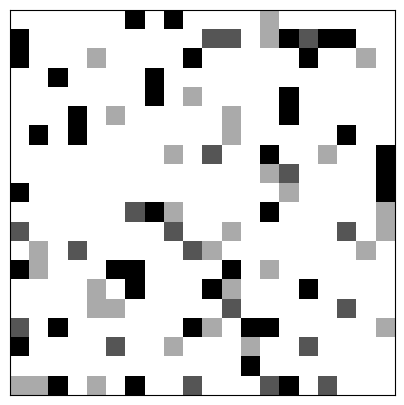

In [2032]:
all_grid = model.datacollector.get_model_vars_dataframe()
fig, axis = plt.subplots(figsize=(5, 5))
axis.set_xticks([])
axis.set_yticks([])
patch = plt.imshow(all_grid.iloc[0][0], cmap = plt.cm.binary)

def animate(frame):
    patch.set_data(all_grid.iloc[frame][0])

anim = animation.FuncAnimation(fig, animate, frames=model.get_steps() - 1)

In [2033]:
anim

C:\Users\PC\AppData\Local\Temp\ipykernel_15040\3584345589.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  patch.set_data(all_grid.iloc[frame][0])
